In [1]:
## Imports etc...
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch 
from sklearn import preprocessing


## Figures: SVG, inline, black backgrounfd
from IPython.display import display, HTML
from IPython.display import set_matplotlib_formats
%matplotlib inline
set_matplotlib_formats('png')
plt.style.use('dark_background')


In [2]:
## main functions
def fetch_reconstructions(folder, labels):
    tree_list = []
    for label in labels:
        tree_list.append(Tree(folder + "/" + label + ".json"))
    return tree_list

def hcluster(mat, leaf_labels, relative_max_cutoff):
    # The Chebyshev distance between persistence landscapes is stable
    # with respect to the bottleneck distance between persistence diagrams.
    model = AgglomerativeClustering(affinity='chebyshev', linkage='complete', distance_threshold=0, n_clusters=None)
    model = model.fit(mat)
    fig, ax = plt.subplots(figsize=(12, 24))
    plt.title('Hierarchical Clustering Dendrogram')
    
    # Create linkage matrix and then plot the dendrogram
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    cutoff = relative_max_cutoff * max(linkage_matrix[:,2])
    sch.set_link_color_palette(["green", "yellow", "magenta", "cyan", "orange"]) ## first column at the bottom
    sch.dendrogram(linkage_matrix, color_threshold=cutoff, above_threshold_color='white', 
               orientation='right', labels=leaf_labels, leaf_font_size=12, leaf_rotation=0, no_labels=True)
    plt.axvline(x=cutoff, c='white', lw=1, linestyle='dashed')
    plt.show()
    return [linkage_matrix, cutoff]

In [3]:
### Importing data

json_folder = "/home/tferr/Desktop/ACA-analysis/json25"

## Import table and remove all zero-rows
data = pd.read_csv("/home/tferr/Desktop/ACA-analysis/landscapes_radial_250-100filtered.csv") 
data = data.loc[(data!=0).any(axis=1)] ## remove all zero-rows


## Prototyping: Work on a subset of the data
#data = data.iloc[:, : 20]    ## consider only the first 20 columns
#display(data.head())         ## preview table
#data.iloc[:, [0,2]].plot.hist(alpha=0.7) ## histogram of first 2 columns

# Cell labels, no of cells, and landscapes
ncells = len(data.columns)
labels = data.columns.tolist()
landscapes = data.to_numpy()


## Import table and remove all zero-rows
data = pd.read_csv("/home/tferr/Desktop/ACA-analysis/brainAreasLength/megaTable-selected.csv")
data = data.set_index('Description')
#data = data.loc[(data!=data).any(axis=1)] ## remove all nan-rows
#data = data.drop('fiber tracts', axis=0)
#data = data.drop('cc', axis=0)

## Prototyping: Work on a subset of the data
#data = data.iloc[:, : 20]    ## consider only the first 20 columns
display(data.head())         ## preview table

data = data.transpose()

display(data.head())         ## preview table


labels = list(data.index)
landscapes = data.to_numpy()


# Should we normalize data!??
landscapes = preprocessing.MinMaxScaler().fit_transform(landscapes)

,195819-020,195839-068,194785-026,195840-037,195199-101,195830-028,195617-009,192106-095,195820-033,200196-059,...,200583-032,195826-064,201393-015,194784-036,201575-032,192106-110,195840-111,201572-015,192108-007,201397-002
Description,,,,,,,,,,,,,,,,,,,,,
Isocortex,52933.040514,37449.149817,19446.089560,41456.344679,18077.535298,75059.254753,11520.548222,51186.995862,16299.899482,66398.189003,...,1986.650547,10953.835066,1042.622138,8243.288352,13959.973245,12647.170767,10218.775121,48386.446246,23658.499972,64884.813171
GU,2833.240189,0.000000,6859.556205,4362.158004,0.000000,0.000000,0.000000,5188.159921,550.178681,0.000000,...,0.000000,0.000000,0.000000,1436.836199,0.000000,0.000000,0.000000,0.000000,530.635321,4532.258272
AUD,410.229207,0.000000,29.159223,0.000000,0.000000,0.000000,0.000000,325.429542,0.000000,0.000000,...,52.711167,0.000000,0.000000,0.000000,775.769279,823.839807,0.000000,256.394280,10.134936,0.000000
RSP,0.000000,2206.387848,0.000000,0.000000,6976.400138,2495.563498,7542.098274,0.000000,0.000000,7556.818268,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,981.787482,0.000000,0.000000,0.000000
ACA,75682.205621,37449.149817,40259.614179,54580.874212,18077.535298,78978.930879,11520.548222,51186.995862,24032.703484,66398.189003,...,12843.803352,12216.248085,1074.741304,8243.288352,17670.340046,12647.170767,10218.775121,55059.102591,23658.499972,64884.813171


Description,Isocortex,GU,AUD,RSP,ACA,ILA,SS,SSp,SSs,MO,...,sAMY,STRd,STRv,CP,PAL,FRP,HPF,CA,RHP,MSC
195819-020,52933.040514,2833.240189,410.229207,0.000000,75682.205621,32.234170,46668.345215,44826.014921,1543.238133,0.000000,...,0.0,3901.290121,5690.360784,3901.290121,175.474961,0.0,21859.892422,19779.715915,0.0,0.0
195839-068,37449.149817,0.000000,0.000000,2206.387848,37449.149817,1374.059697,7506.493277,7506.493277,0.000000,1463.501367,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,862.844092,204.131475,0.0,0.0
194785-026,19446.089560,6859.556205,29.159223,0.000000,40259.614179,165.001750,0.000000,0.000000,0.000000,8233.049715,...,0.0,1818.272640,25681.314201,1818.272640,113.370118,0.0,9716.724948,6011.524913,0.0,0.0
195840-037,41456.344679,4362.158004,0.000000,0.000000,54580.874212,6702.556133,9461.958982,9446.521935,0.000000,8314.446907,...,0.0,8820.637268,6467.820873,8801.705261,3874.190097,0.0,26.134911,26.134911,0.0,0.0
195199-101,18077.535298,0.000000,0.000000,6976.400138,18077.535298,498.204220,8417.425035,8417.425035,0.000000,923.774593,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0


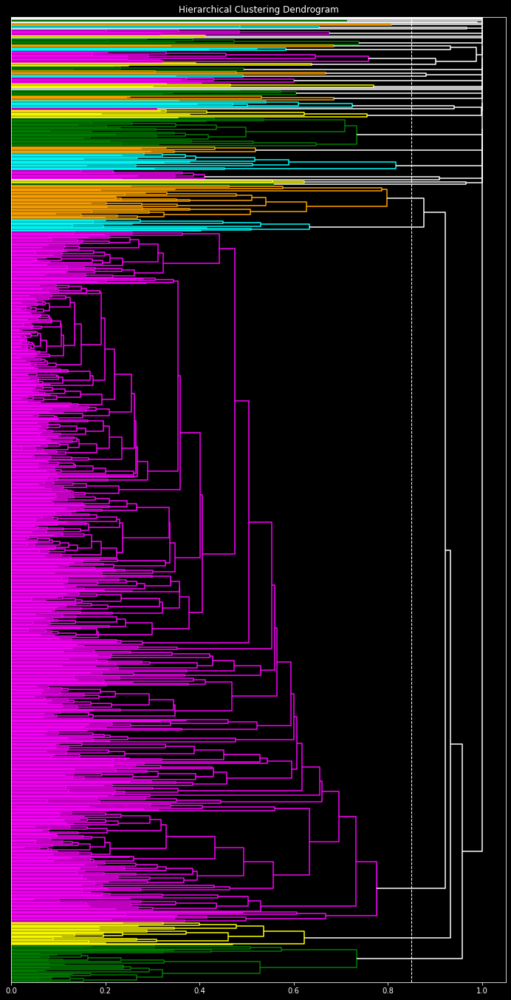

No of cells: 1023
No. groups: 1
No. groups: 1

String[] group1 = { "193871-001", "194781-078", "201569-012", "196548-035", "195828-008", "201572-023", "195838-047", "194778-116", "192108-251", "194778-119", "196550-019", "196549-006", "196549-034", "201399-021", "196548-009", "201398-016", "201398-021", "196548-008", "201575-046", "201401-012", "195787-008", "201391-005", "201574-032", "196549-022", "195840-103", "201401-014", "196549-021", "195838-057", "195830-008", "195826-054", "194781-006", "195840-022", "196548-028", "200579-007", "195826-093", "201570-021", "201568-018", "195841-044", "194778-087", "201570-022", "201574-038", "194778-110", "195839-187", "200309-030", "192311-050", "200310-022", "195840-016", "195833-070", "194781-055", "195826-058", "195839-189", "194778-009", "201568-004", "195839-174", "195840-021", "201574-037", "195841-050", "200313-004", "200315-033", "194782-015", "194779-014", "195834-030", "194778-100", "194778-081", "195045-063", "195041-008", "195841-0

In [5]:
###HACK: Not sure why, but a dummy trimming of the data to its size speeds up processing!?
landscapes = landscapes[:ncells]
labels = labels[:ncells]

# Obtain the distance matrix (Z), and cutoff value used in dendrogram
Z, cutoff = hcluster(landscapes, labels, 0.85)

## Obtain the 'flat' cluster list. This contains the group indices for each leaf
T = sch.fcluster(Z, t=5, criterion='maxclust')
#display(T)

## Now start assembling the groups.
## !!!IMPORTANT!!!: leaves_list returns leaf indices from left-to-right. Presumably,
## since we've rotated the histogram, we need to reverse leaves_list. Do double-check
## with a small dataset this is indeed intended. Otherwise results will be non-sensical
cluster_dict = {}
ranked_label_indices = reversed(sch.leaves_list(Z))
for groupid, label_index in zip(T, ranked_label_indices):
    if not (str(groupid) in cluster_dict):
        cluster_dict[str(groupid)] = []
    cluster_dict[str(groupid)].append(labels[label_index])

## Quick sanity check:
print("No of cells: " + str(ncells))
print("No. groups: " + str(len(cluster_dict)))
print("No. groups: " + str(len(set(T))))

## Since we reversed the leaf indices, it is convenient to re-arrange things so that group 1 to N
## goes from top to bottom, and labels whithin each group are also sorted from to to bottom, as in
## dendrogram
for key, value in cluster_dict.items():
    cluster_dict[key] = list(reversed(value))

## Now print the groups
print("")
for key in sorted(cluster_dict):
    print('String[] group' + str(key) + ' = { "' + '", "'.join([str(x) for x in cluster_dict[key]]) + '"};')
print("")

## Now get the N-elements in the middle of the group
ncentroids = 10 ### should be odd
for key, value in cluster_dict.items():
    middle_index = math.trunc(len(value)/2)
    newlist = []
    for index in range(max(0, middle_index-round(ncentroids/2)), min(len(value), middle_index+ round(ncentroids/2))):
        newlist.append(value[index])
    print('String[] group' + str(key) + 'reps = { "' + '", "'.join([str(x) for x in newlist]) + '"};')

In [12]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing



## Figures: SVG, inline, black backgrounfd
from IPython.display import display, HTML
from IPython.display import set_matplotlib_formats
%matplotlib inline
set_matplotlib_formats('svg')
#plt.style.use('dark_background')

from matplotlib.pyplot import figure

#figure(figsize=(64, 48))

%matplotlib inline

## Import table and remove all zero-rows
data = pd.read_csv("/home/tferr/Desktop/ACA-analysis/brainAreasLength/megaTable-selected.csv")
data = data.set_index('Description')
#data = data.loc[(data!=data).any(axis=1)] ## remove all nan-rows
#data = data.drop('fiber tracts', axis=0)
#data = data.drop('cc', axis=0)

## Prototyping: Work on a subset of the data
#data = data.iloc[:, : 20]    ## consider only the first 20 columns
display(data.head())         ## preview table



labels = list(data.index)
data = preprocessing.MinMaxScaler().fit_transform(data)

#data.iloc[:, [0,2]].plot.hist(alpha=0.7) ## histogram of first 2 columns

# # Cell labels, no of cells, and landscapes
# fig=plt.figure(figsize=(16,14), dpi= 100, facecolor='w', edgecolor='k')

# heat_map = sns.heatmap(data, cmap="viridis", 
#                        annot=False, cbar_kws={'label': 'Cable length (um)', 'orientation': 'horizontal'},
#                        robust=True, xticklabels = False, yticklabels=labels)
# plt.show()


#sns.set(font_scale=1.4) ## this resets the dark backround!!?

cluster_map = sns.clustermap(data, cmap="viridis",
                       annot=False, row_cluster=False, #cbar_kws={'label': 'Cable length (um)', 'orientation': 'horizontal'},
                       dendrogram_ratio=(.1, .1),
                             cbar_pos=(0, .2, .03, .4),
                             figsize=(120,60),
                             xticklabels = True,
                              tree_kws=dict(linewidths=1.5, colors=(1, 1, 1)),
                             annot_kws={"size": 12},
                             yticklabels=labels)
plt.show()

,195819-020,195839-068,194785-026,195840-037,195199-101,195830-028,195617-009,192106-095,195820-033,200196-059,...,200583-032,195826-064,201393-015,194784-036,201575-032,192106-110,195840-111,201572-015,192108-007,201397-002
Description,,,,,,,,,,,,,,,,,,,,,
Isocortex,52933.040514,37449.149817,19446.089560,41456.344679,18077.535298,75059.254753,11520.548222,51186.995862,16299.899482,66398.189003,...,1986.650547,10953.835066,1042.622138,8243.288352,13959.973245,12647.170767,10218.775121,48386.446246,23658.499972,64884.813171
GU,2833.240189,0.000000,6859.556205,4362.158004,0.000000,0.000000,0.000000,5188.159921,550.178681,0.000000,...,0.000000,0.000000,0.000000,1436.836199,0.000000,0.000000,0.000000,0.000000,530.635321,4532.258272
AUD,410.229207,0.000000,29.159223,0.000000,0.000000,0.000000,0.000000,325.429542,0.000000,0.000000,...,52.711167,0.000000,0.000000,0.000000,775.769279,823.839807,0.000000,256.394280,10.134936,0.000000
RSP,0.000000,2206.387848,0.000000,0.000000,6976.400138,2495.563498,7542.098274,0.000000,0.000000,7556.818268,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,981.787482,0.000000,0.000000,0.000000
ACA,75682.205621,37449.149817,40259.614179,54580.874212,18077.535298,78978.930879,11520.548222,51186.995862,24032.703484,66398.189003,...,12843.803352,12216.248085,1074.741304,8243.288352,17670.340046,12647.170767,10218.775121,55059.102591,23658.499972,64884.813171


/home/tferr/anaconda3/envs/pyimagej/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
